In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import warnings
import plotly.subplots as ps
import folium
from folium.plugins import HeatMap
import matplotlib.colors as mcolors
import re
from folium.plugins import MarkerCluster
import geopandas as gpd
from shapely.geometry import Polygon
from scipy.spatial import ConvexHull
from IPython.display import Image

# Ignore SettingWithCopyWarning
warnings.simplefilter(action='ignore', category=Warning)

# Data Analysis Plan for ECOBICI Stations CSV
## 1. Data Type Identification:
* Determine the data types of each column in the ECOBICI stations dataset.
## 2. Dataset Dimensions:
* Assess the shape of the dataset, including the number of rows and columns.
* Identify the unique number of stations within the dataset.
## 3. Missing Values Assessment:
* Detect and address any missing values within the dataset.
* Convert columns to appropriate data types where necessary.
## 4. Data Cleaning:
* Clean and rectify any discrepancies or errors in the dataset, specifically within the columns related to street, colonia, alcaldia, longitude, latitude, and station type.

In [3]:
station_df = pd.read_csv('/Users/Work/Documents/ecobici-cdmx-dataset/stations.csv')
station_df

,sistema,num_cicloe,calle_prin,calle_secu,colonia,alcaldia,latitud,longitud,sitio_de_e,estatus
0,Ecobici,1,Río Sena,Río Balsas,Cuauhtémoc,Cuauhtémoc,19.433590,-99.167819,Arroyo,Instalada
1,Ecobici,2,Río Guadalquivir,Río Nazas,Cuauhtémoc,Cuauhtémoc,19.430623,-99.171231,Arroyo,Instalada
2,Ecobici,3,Reforma,Insurgentes,Tabacalera,Cuauhtémoc,19.431630,-99.158547,Banqueta,Instalada
3,Ecobici,4,Río Nilo,Río Pánuco,Cuauhtémoc,Cuauhtémoc,19.428491,-99.171693,Arroyo,Instalada
4,Ecobici,5,Río Pánuco,Río Tíber,Cuauhtémoc,Cuauhtémoc,19.429804,-99.169451,Arroyo,Instalada
...,...,...,...,...,...,...,...,...,...,...
670,Ecobici,268 - 269,Luis Donaldo Colosio,Jesús García,Buenavista,Cuauhtémoc,19.442467,-99.151658,Arroyo,Instalada
671,Ecobici,271 - 272,Jesús García,Carlos J. Meneses,Buenavista,Cuauhtémoc,19.443684,-99.152465,Arroyo,Instalada
672,Ecobici,273 - 274,Luis Donaldo Colosio,Jesús García,Buenavista,Cuauhtémoc,19.442707,-99.152956,Arroyo,Instalada
673,Ecobici,390 - 391,Oso,Félix Cuevas,Actipan,Benito Juárez,19.373384,-99.178173,Arroyo,Instalada


# Handling Station Values with Hyphens in the 'num_cicloe' Column
## 1. Identify and Separate:
* Identify rows in the 'num_cicloe' column that contain hyphens.
* Separate these values into two distinct integers.
## 2. Data Cleaning:
* Determine the best approach to handle these separated values:
* Option 1: Keep both integers as separate entries, adding new rows if necessary.
* Option 2: Use a predefined rule to select one of the integers.
* Option 3: Aggregate the values if applicable.
## 3. Update the Dataset:
* Implement the chosen approach to update the dataset while ensuring data integrity and consistency.
## 4. Review and Validate:
* Review the updated dataset to ensure that the handling of hyphenated values is correct.
* Validate the changes against the ECOBICI website or other authoritative sources to ensure accuracy.

In [5]:
# Check unique values
station_df['num_cicloe'].unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34',
       '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45',
       '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56',
       '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67',
       '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78',
       '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89',
       '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100',
       '102', '103', '104', '105', '106', '109', '110', '111', '112',
       '113', '114', '115', '116', '117', '118', '119', '120', '121',
       '122', '123', '124', '125', '126', '127', '128', '129', '130',
       '131', '132', '133', '134', '135', '136', '137', '138', '139',
       '140', '141', '142', '143', '144', '145', '146', '147', '1

## Identify all rows in the 'num_cicloe' column that contain hyphens.
* Note that most hyphenated values are consecutive, except for '264 - 275'.
## 1. Keep the First Value:
* For each hyphenated value, retain the first integer of the range.
## 2. Special Case Handling:
* For the value '264 - 275', note that '275' should be associated with '266' for future merging with trip data.
## 3. Convert to Numeric:
* After handling the hyphenated values, convert the 'num_cicloe' column to a numeric data type.

In [7]:
def handle_ranges(value):
    if '-' in value:
        return value.split('-')[0]  # Take the first value of the range
    return value

# Apply the function to the 'num_cicloe' column
station_df['num_cicloe'] = station_df['num_cicloe'].apply(handle_ranges)

# Convert the cleaned 'num_cicloe' column to numeric
station_df['num_cicloe'] = pd.to_numeric(station_df['num_cicloe'], errors='coerce')

station_df['num_cicloe'].nunique()

675

## There are 675 unique station values
## I know there are stations with values higher than 675
## Will look into this further

In [9]:
# Check unique values
unique_values = station_df['num_cicloe'].unique()

# Generate the expected range from the minimum to the maximum value
expected_range = np.arange(unique_values.min(), unique_values.max() + 1)

# Identify missing values by comparing the sets
missing_values = set(expected_range) - set(unique_values)

# Convert the set to a sorted list
missing_values = sorted(missing_values)

print(f"Missing values: {missing_values}")
print(f"Number of missing values: {len(missing_values)}")

Missing values: [101, 108, 159, 193, 236, 238, 267, 269, 272, 274, 275, 289, 311, 344, 350, 364, 368, 376, 379, 382, 383, 388, 391, 400, 403, 406, 408, 410, 411, 418, 426, 431, 435, 446]
Number of missing values: 34


## The missing values match some of the values that where counted as the previous consecutive value
## The other values shown as missing do not actually exist as a station in CDMX
## So there are 675 unique station values
## I will continue with the rest of the columns

In [11]:
station_df.dtypes

sistema        object
num_cicloe      int64
calle_prin     object
calle_secu     object
colonia        object
alcaldia       object
latitud       float64
longitud      float64
sitio_de_e     object
estatus        object
dtype: object

In [12]:
station_df

,sistema,num_cicloe,calle_prin,calle_secu,colonia,alcaldia,latitud,longitud,sitio_de_e,estatus
0,Ecobici,1,Río Sena,Río Balsas,Cuauhtémoc,Cuauhtémoc,19.433590,-99.167819,Arroyo,Instalada
1,Ecobici,2,Río Guadalquivir,Río Nazas,Cuauhtémoc,Cuauhtémoc,19.430623,-99.171231,Arroyo,Instalada
2,Ecobici,3,Reforma,Insurgentes,Tabacalera,Cuauhtémoc,19.431630,-99.158547,Banqueta,Instalada
3,Ecobici,4,Río Nilo,Río Pánuco,Cuauhtémoc,Cuauhtémoc,19.428491,-99.171693,Arroyo,Instalada
4,Ecobici,5,Río Pánuco,Río Tíber,Cuauhtémoc,Cuauhtémoc,19.429804,-99.169451,Arroyo,Instalada
...,...,...,...,...,...,...,...,...,...,...
670,Ecobici,268,Luis Donaldo Colosio,Jesús García,Buenavista,Cuauhtémoc,19.442467,-99.151658,Arroyo,Instalada
671,Ecobici,271,Jesús García,Carlos J. Meneses,Buenavista,Cuauhtémoc,19.443684,-99.152465,Arroyo,Instalada
672,Ecobici,273,Luis Donaldo Colosio,Jesús García,Buenavista,Cuauhtémoc,19.442707,-99.152956,Arroyo,Instalada
673,Ecobici,390,Oso,Félix Cuevas,Actipan,Benito Juárez,19.373384,-99.178173,Arroyo,Instalada


In [13]:
station_df.isna().sum()

sistema       0
num_cicloe    0
calle_prin    0
calle_secu    0
colonia       0
alcaldia      0
latitud       0
longitud      0
sitio_de_e    0
estatus       0
dtype: int64

## I do not need the following columns :
* 'sistema'
* 'calle_prin'
* 'calle_secu'
* 'sitio_de_e' 
* 'estatus'
## 1. I will drop these columns
## 2.  Will convert the remaing columns to string and float

In [15]:
station_df.drop(columns=['sistema', 'calle_prin', 'calle_secu', 'sitio_de_e', 'estatus'], inplace=True)
station_df['num_cicloe'] = station_df['num_cicloe'].astype('int16')
station_df['colonia'] = station_df['colonia'].astype('string')
station_df['alcaldia'] = station_df['alcaldia'].astype('string')
station_df['latitud'] = station_df['latitud'].astype('float')
station_df['longitud'] = station_df['longitud'].astype('float')

station_df.dtypes

num_cicloe             int16
colonia       string[python]
alcaldia      string[python]
latitud              float64
longitud             float64
dtype: object

In [16]:
station_df

,num_cicloe,colonia,alcaldia,latitud,longitud
0,1,Cuauhtémoc,Cuauhtémoc,19.433590,-99.167819
1,2,Cuauhtémoc,Cuauhtémoc,19.430623,-99.171231
2,3,Tabacalera,Cuauhtémoc,19.431630,-99.158547
3,4,Cuauhtémoc,Cuauhtémoc,19.428491,-99.171693
4,5,Cuauhtémoc,Cuauhtémoc,19.429804,-99.169451
...,...,...,...,...,...
670,268,Buenavista,Cuauhtémoc,19.442467,-99.151658
671,271,Buenavista,Cuauhtémoc,19.443684,-99.152465
672,273,Buenavista,Cuauhtémoc,19.442707,-99.152956
673,390,Actipan,Benito Juárez,19.373384,-99.178173


## Renaming columns to English

In [18]:
station_df.rename(columns={'num_cicloe': 'Station_ID', 
                           'latitud': 'Latitude', 
                           'longitud': 'Longitude',
                           'colonia': 'Colonia', 
                           'alcaldia': 'Alcaldia'}, inplace=True)

station_df

,Station_ID,Colonia,Alcaldia,Latitude,Longitude
0,1,Cuauhtémoc,Cuauhtémoc,19.433590,-99.167819
1,2,Cuauhtémoc,Cuauhtémoc,19.430623,-99.171231
2,3,Tabacalera,Cuauhtémoc,19.431630,-99.158547
3,4,Cuauhtémoc,Cuauhtémoc,19.428491,-99.171693
4,5,Cuauhtémoc,Cuauhtémoc,19.429804,-99.169451
...,...,...,...,...,...
670,268,Buenavista,Cuauhtémoc,19.442467,-99.151658
671,271,Buenavista,Cuauhtémoc,19.443684,-99.152465
672,273,Buenavista,Cuauhtémoc,19.442707,-99.152956
673,390,Actipan,Benito Juárez,19.373384,-99.178173


In [19]:
station_df['Colonia'].unique()

<StringArray>
[              'Cuauhtémoc',               'Tabacalera',
                   'Juárez',                   'Centro',
               'Roma Norte',                  'Condesa',
                'Hipódromo',        'Hipódromo Condesa',
               'San Rafael',                 'Doctores',
 ...
     'San Jose Insurgentes',            'Guadalupe Inn',
    'Guadalupe Chimalistac',                 'Agricola',
           'Santa Catarina', 'Barrio De Santa Catarina',
           'Villa Coyoacan',     'Barrio la Concepción',
        'Parque San Andres',         'Barrio San Lucas']
Length: 106, dtype: string

In [20]:
station_df['Alcaldia'].unique()

<StringArray>
[    'Cuauhtémoc',   'Río Amazonas', 'Miguel Hidalgo',  'Benito Juárez',
   'Azcapotzalco',       'Coyoacan', 'Alvaro Obregon']
Length: 7, dtype: string

## Rio Amazonas is not an Alcaldia

In [22]:
station_df[station_df['Alcaldia'] == 'Río Amazonas']

,Station_ID,Colonia,Alcaldia,Latitude,Longitude
9,10,Tabacalera,Río Amazonas,19.433431,-99.155142


## Tabacalera is located in alcaldia Cuauhtémoc
## I will replace Rio Amazonas with Cuauhtémoc

In [24]:
station_df['Alcaldia'].replace('Río Amazonas', 'Cuauhtémoc', inplace=True)

In [25]:
station_df[station_df['Latitude'] < 0]

,Station_ID,Colonia,Alcaldia,Latitude,Longitude


In [26]:
station_df['Alcaldia'].value_counts()

Alcaldia
Cuauhtémoc        243
Benito Juárez     212
Miguel Hidalgo    137
Coyoacan           37
Azcapotzalco       28
Alvaro Obregon     18
Name: count, dtype: Int64

## Cuautemoc has the most stations
## Alvaro Obregon has the least

In [28]:
station_df['Colonia'].value_counts()

Colonia
Polanco                     44
Roma Norte                  37
Centro                      31
Juárez                      24
Hipódromo                   19
                            ..
Agricola                     1
Barrio De Santa Catarina     1
Molino del Rey               1
Santo Tomas                  1
Barrio San Lucas             1
Name: count, Length: 106, dtype: Int64

## Top 5 Colonias in CDMX with the most stations are Polanco, Roma Norte, Centro, Juarez, Hipodromo

In [30]:
station_df.groupby(['Colonia', 'Alcaldia']).size().sort_values(ascending=False)

Colonia                  Alcaldia      
Polanco                  Miguel Hidalgo    44
Roma Norte               Cuauhtémoc        37
Centro                   Cuauhtémoc        31
Juárez                   Cuauhtémoc        24
Hipódromo                Cuauhtémoc        19
                                           ..
San Diego Churubusco     Coyoacan           1
Irrigacion               Miguel Hidalgo     1
Piedad Narvarte          Benito Juárez      1
Residencial Emperadores  Benito Juárez      1
Letrán Valle             Benito Juárez      1
Length: 106, dtype: int64

##  Looks like most activity happens in Miguel Hidalgo and Cuauhtemoc

In [ ]:
# Calculate the mean of 'latitud' and 'longitud'
mean_lat_lon = station_df[['Latitude', 'Longitude']].mean()

# Create a Folium map centered at the mean latitude and longitude
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=13)

# Add a red marker at the mean latitude and longitude
folium.Marker(
    location=map_center,
    popup='Mean Location',
    icon=folium.Icon(color='red')
).add_to(mymap)

# Display the map
mymap

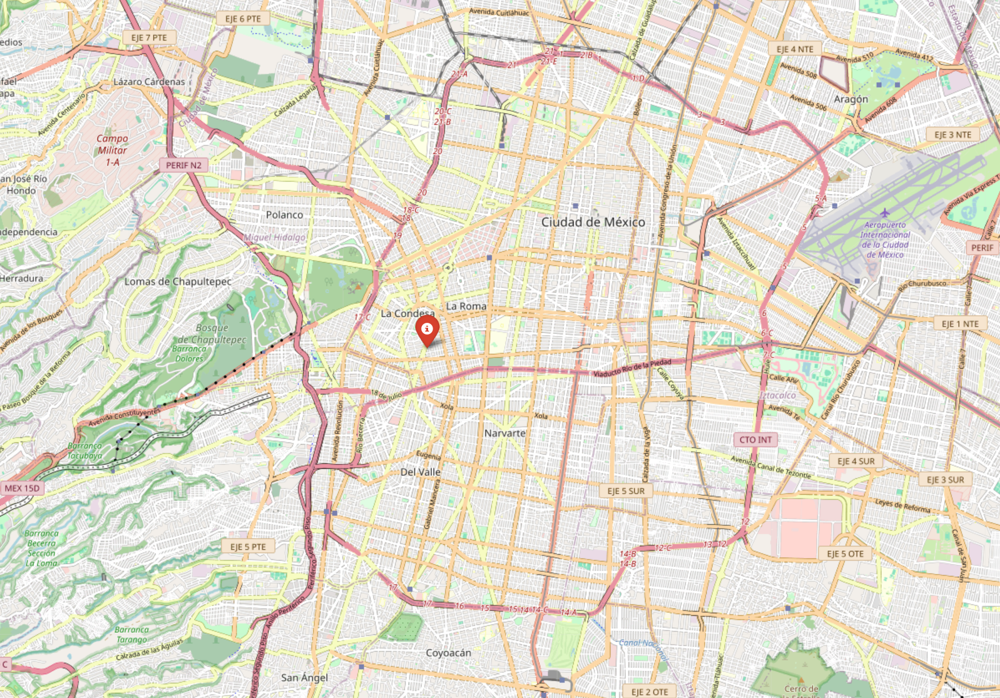

## The mean for latitude and longitude cordinates show a pin in what appears to be between Roma Norte and Condesa Colonias 
## The Main Avenue where the pin is close to is called Avenida Insurgentes which is a very busy and popular avenue for public transport and ECOBICI
## We can assume that most of the Activity will revolve around this area

In [ ]:
# Create a list of unique Alcaldias
alcaldias = station_df['Alcaldia'].unique()

# Generate a color map for the Alcaldias
colors = plt.cm.get_cmap('tab20', len(alcaldias)).colors  # 'tab20' is a colormap with 20 colors
color_map = {alcaldia: colors[i] for i, alcaldia in enumerate(alcaldias)}

# Convert matplotlib colors to hex format for Folium
color_map_hex = {alcaldia: mcolors.rgb2hex(color) for alcaldia, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude
mean_lat_lon = station_df[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=13)

# Add a marker for each station in the DataFrame with color based on Alcaldia
for idx, row in station_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Colonia']}, {row['Alcaldia']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Alcaldia']])
    ).add_to(mymap)

# Create a legend
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 200px; height: 240px; 
     background-color: white; z-index:9999; font-size:18px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Alcaldias</b><br>
     '''
for alcaldia, color in color_map_hex.items():
    legend_html += f'<i style="background:{color}; width: 10px; height: 10px; display: inline-block;"></i> {alcaldia}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))
    
# Display the map
mymap

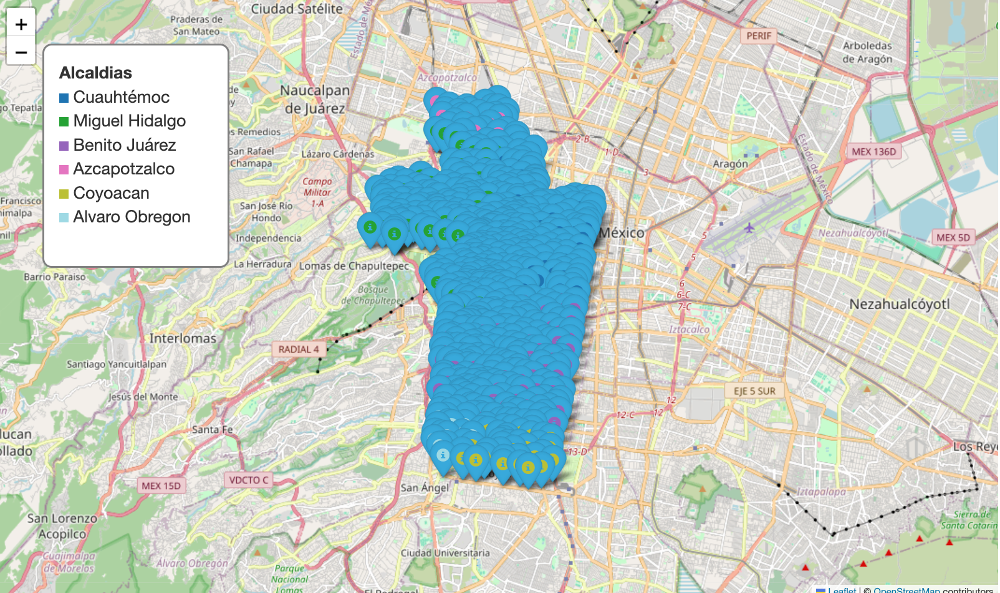

## The above map shows the distribution of bike stations by Alcaldia for CDMX
## We can see that there is an obvious limit to where ECOBICIS are found
## More data is needed to determine the possible reasons for the locations
## 1. I suspect elevation in some areas are higher in elevation such as hills which are not suitable for biking short distances
## 2. Crime/safety in certain areas 
## 3. Poor street conditions and no bike lanes